<h2> Figure for paper: Comparison of the PV of Xu with the optimal PV

Comparison on the DNS dataset for the 10th layer

In [1]:
import os

#add the root directory
os.chdir('../')

In [7]:
from os import listdir
from os.path import isfile, join
import numpy as np
from scipy.io import loadmat
from tools import *
import matplotlib.pyplot as plt
from loader import *
import logging
from utils import *
import matplotlib.gridspec as gridspec
from matplotlib.ticker import ScalarFormatter
from matplotlib.lines import Line2D
from matplotlib.patches import Rectangle, ConnectionPatch
import random
import dcor

logging.disable(logging.CRITICAL) #disable the logging

In [3]:
data_path = 'data-files/'
path_data = 'data-files/'
nbr_species = 21
nbr_rows = 1536
nbr_cols = 1024

layer = 10 #chose layer to inspect

In [4]:
files = [i for i in listdir(data_path) if isfile(join(data_path + i))]
print(f"Number of files: {len(files)}")

Number of files: 98


In [5]:
state_space_names = []
state_space_source_names = [] #to check it is the same order as the state space
Not_species = ["T","U","V","W","X","Z"]
state_space = np.zeros((1,nbr_species))
data_state_space = np.zeros((nbr_rows*nbr_cols,nbr_species))
data_state_space_source = np.zeros((nbr_rows*nbr_cols,nbr_species))
data_mf = np.zeros((nbr_rows*nbr_cols,1))
data_T = np.zeros((nbr_rows*nbr_cols,1))

counter_state_space = 0
counter_state_space_source = 0

for file in files:
    if file.endswith('.mat'):
        print(f"Busy with {file}")

        data = loadmat(data_path + file)

        filename = file.removesuffix('.mat')
        file_data = np.array(data[filename])
        

        #if name of the file is not starting with an uppercase
        if(not file[0] == "R" and file[0].isupper() and file[0] not in Not_species):
            state_space_names.append(file.removesuffix('_3D_slice.mat'))
            flattened_data = file_data[layer, 0][0, :, :].flatten()
            data_state_space[:,counter_state_space] = flattened_data

            counter_state_space+=1

        elif(file[0] == "R"):
            state_space_source_names.append(file.removesuffix('_3D_slice.mat'))
            flattened_data = file_data[layer, 0][0, :, :].flatten()
            data_state_space_source[:,counter_state_space_source] = flattened_data

            counter_state_space_source+=1

        elif(file[0] == "Z"):

            flattened_data = file_data[layer, 0][0, :, :].flatten()
            data_mf[:,0] = flattened_data
            
            print()
            print("mass fraction data done")
            print()

        elif(file[0] == "T"):

            flattened_data = file_data[layer, 0][0, :, :].flatten()
            data_T[:,0] = flattened_data
            
            print()
            print("Temperature data done")
            print()

print(state_space_names)
print(f"counters of state space and sources are {counter_state_space} and {counter_state_space_source}")

Busy with curvature_Condi_3D_slices.mat
Busy with H2NN_3D_slice.mat
Busy with H2O2_3D_slice.mat
Busy with H2O_3D_slice.mat
Busy with H2_3D_slice.mat
Busy with HNO_3D_slice.mat
Busy with HO2_3D_slice.mat
Busy with HONO2_3D_slice.mat
Busy with HONO_3D_slice.mat
Busy with H_3D_slice.mat
Busy with N2H3_3D_slice.mat
Busy with N2O_3D_slice.mat
Busy with N2_3D_slice.mat
Busy with NH2_3D_slice.mat
Busy with NH_3D_slice.mat
Busy with NNH_3D_slice.mat
Busy with NO2_3D_slice.mat
Busy with NO_3D_slice.mat
Busy with N_3D_slice.mat
Busy with O2_3D_slice.mat
Busy with OH_3D_slice.mat
Busy with O_3D_slice.mat
Busy with RH2NN_3D_slice.mat
Busy with RH2O2_3D_slice.mat
Busy with RH2O_3D_slice.mat
Busy with RH2_3D_slice.mat
Busy with RHNO_3D_slice.mat
Busy with RHO2_3D_slice.mat
Busy with RHONO2_3D_slice.mat
Busy with RHONO_3D_slice.mat
Busy with RH_3D_slice.mat
Busy with RN2H3_3D_slice.mat
Busy with RN2O_3D_slice.mat
Busy with RN2_3D_slice.mat
Busy with RNH2_3D_slice.mat
Busy with RNH_3D_slice.mat
Busy w

PV and PV source of Xu

In [6]:
PV_Xu = data_state_space[:,2] - data_state_space[:,3] - data_state_space[:,18]
PV_Xu = (PV_Xu - PV_Xu.min())/(PV_Xu.max() - PV_Xu.min())
PV_source_Xu = data_state_space_source[:,2] - data_state_space_source[:,3] - data_state_space_source[:,18]

Optimized PV and optimized PV source

In [ ]:
filename = "Xu-AE-opt_RMSprop-epo_100000-lr_0.025-date_28Jan2025-hour_17h43_Tr35a_s3"
filename_metadata = filename + "_metadata.pkl"
path_metadata = "metadata/"
filename_species_names = "Xu-state-space-names.csv"
path_data = "data-files/"

loader = loadData(filename_species_names, path_metadata, filename_metadata)
idx_species_removed = loader.metadata["idx species removed"]
model = loader.loadModel()
id_model = loader.metadata["Training_id"]
output_idx = loader.metadata["output species idx"]
idx_species_removed = loader.metadata["idx species removed"]
input_scaling = loader.metadata["input scaling"]
input_species_scaling = loader.metadata["input species scaling"]
input_species_bias = loader.metadata["input species bias"]
range_mf  = loader.metadata["range_mf"]

optimized_PV = model.get_PV(torch.from_numpy(np.delete(data_state_space, idx_species_removed, axis=1))).detach().numpy()
optimized_PV_source = model.get_PV(torch.from_numpy(np.delete(data_state_space_source, idx_species_removed, axis=1))).detach().numpy()

In [10]:
from scipy.stats import spearmanr

rho, p_value = spearmanr(data_mf.flatten(), PV_Xu)
dcor_Xu = dcor.distance_correlation(data_mf.flatten(), PV_Xu)

print(f"Pearson correlation between the mixture fraction and the optimized PV {np.round(np.corrcoef(data_mf.flatten(), PV_Xu)[0, 1],3)}")
print(f"Spearman correlation between the mixture fraction and the optimized PV {np.round(rho, 3)}")
print(f"Distance correlation between the mixture fraction and the optimized PV {np.round(dcor_Xu, 3)}")

Pearson correlation between the mixture fraction and the optimized PV 0.328
Spearman correlation between the mixture fraction and the optimized PV 0.863
Distance correlation between the mixture fraction and the optimized PV 0.557


In [13]:
from scipy.stats import spearmanr

rho, p_value = spearmanr(data_mf.flatten(), optimized_PV.flatten())
dcor_optimized = dcor.distance_correlation(data_mf.flatten(), optimized_PV.flatten())

print(f"Pearson correlation between the mixture fraction and the heuristic PV {np.round(np.corrcoef(data_mf.flatten(), optimized_PV.flatten())[0, 1],3)}")
print(f"Spearman correlation between the mixture fraction and the heuristic PV {np.round(rho, 3)}")
print(f"Distance correlation between the mixture fraction and the heuristic PV {np.round(dcor_optimized, 3)}")

Pearson correlation between the mixture fraction and the heuristic PV 0.161
Spearman correlation between the mixture fraction and the heuristic PV 0.784
Distance correlation between the mixture fraction and the heuristic PV 0.462


<h3> Combined plots

C:\Windows\Temp\ipykernel_30004\269289386.py:28: RuntimeWarning: invalid value encountered in log10
  dataColor = np.log10(data_state_space[:,idxSpecies] + 10**-20)


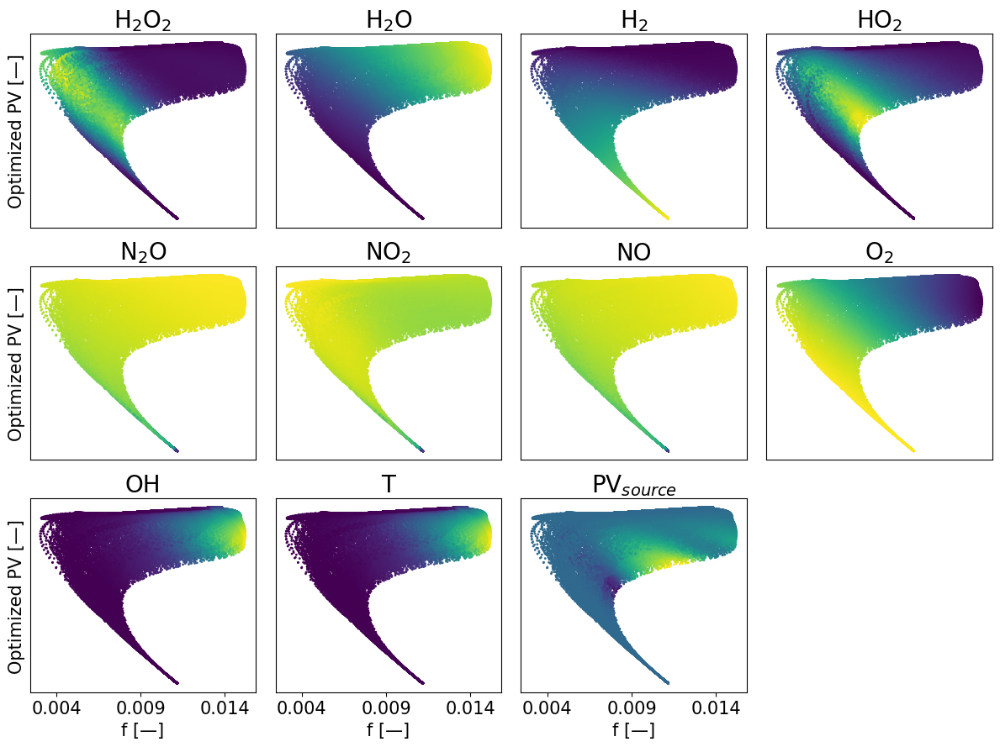

In [10]:
rows, cols = 3,4

keysSpecies = ['H2O2', 'H2O', 'H2', 'HO2', 'N2O', 'NO2', 'NO', 'O2', 'OH']
keys = ['H2O2', 'H2O', 'H2', 'HO2', 'N2O', 'NO2', 'NO', 'O2', 'OH', 'T', 'PV1']

Xu_optimized = "optimized"

save = False
pathSave = f"C:/Users/admin/Documents/Parente/Figures/2024-PV-optimization/Paper/A priori/{'Heuristic' if Xu_optimized.lower() == 'xu' else 'Optimized'}/"
name = f"f-PV manifolds - coloured by QoIs - DNS - {Xu_optimized} - log(NOx).png"

fig, axes = plt.subplots(rows, cols, figsize=(12,9))  # Define the grid
axes = axes.flatten()
for i, key in enumerate(keys):
    ax = axes[i]

    if(Xu_optimized.lower() == "xu"):
         dataPV = PV_Xu
    elif(Xu_optimized.lower() == "optimized"):
         dataPV = optimized_PV
    else:
         raise ValueError("Variable 'Xu_optimized' has an invalid value; Choose either 'xu' or 'optimized'.")

    if(key in keysSpecies):
         idxSpecies = state_space_names.index(key)
         dataColor = data_state_space[:,idxSpecies]
         if(key[0] == "N"): #NOx species in the log-scale
              dataColor = np.log10(data_state_space[:,idxSpecies] + 10**-20)
    elif(key == "T"):
         datacolor = data_T
    elif(key == "PV1"):
         if(Xu_optimized.lower() == "xu"):
            dataColor = PV_source_Xu
         elif(Xu_optimized.lower() == "optimized"):
            dataColor = optimized_PV_source
         

    ax.scatter(data_mf, dataPV, c = dataColor, cmap = "viridis", s=1)

    if(i>len(keys)-cols):
        ax.set_xticks([0.004, 0.009, 0.014])
        ax.tick_params(axis="x", labelsize=15)
        ax.set_xlabel("f [\u2014]", fontsize = 15)
    else:
        ax.set_xticks([])
    if(i%cols == 0):
        ax.set_ylabel(f'{"Optimized" if Xu_optimized.lower() == "optimized" else "Heuristic"} PV [\u2014]', fontsize = 15)
    ax.set_yticks([])
    
    key = key.replace("2", "$_{2}$").replace("1", "$_{source}$")

    ax.set_title(rf"{key}", fontsize=20)


for j in range(len(keys), len(axes)): #disables axes of plots not used
    axes[j].axis("off")

handles, labels = axes[0].get_legend_handles_labels()

plt.tight_layout()
if(save):
        plt.savefig(f"{pathSave}{name}", dpi = 300, bbox_inches="tight")
plt.show()

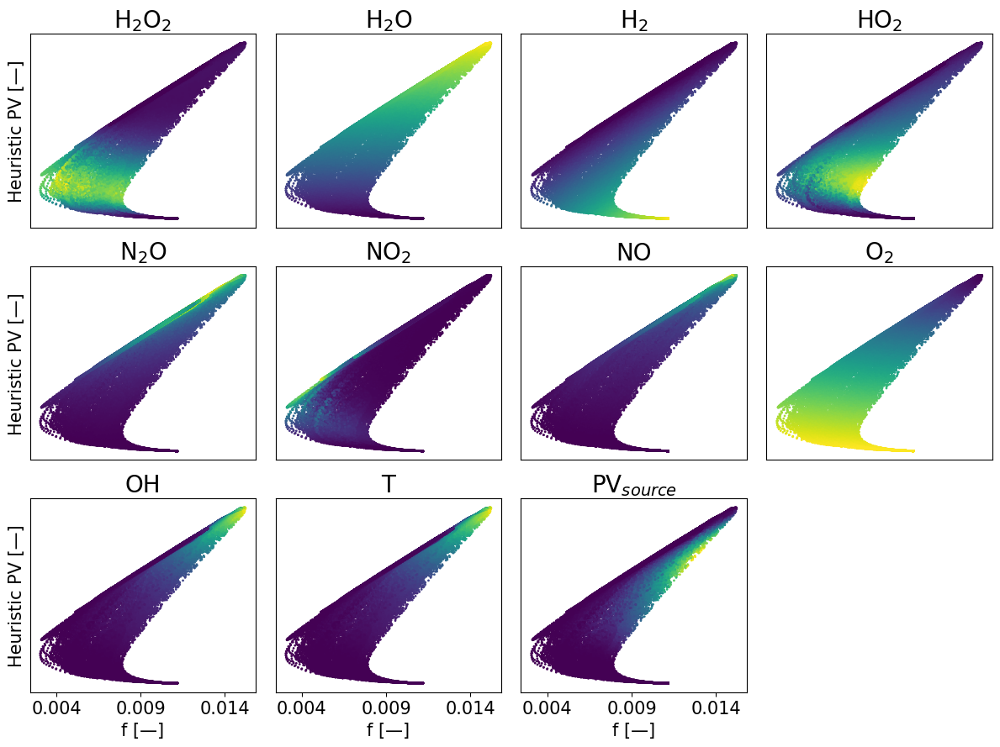

In [11]:
rows, cols = 3,4

keysSpecies = ['H2O2', 'H2O', 'H2', 'HO2', 'N2O', 'NO2', 'NO', 'O2', 'OH']
keys = ['H2O2', 'H2O', 'H2', 'HO2', 'N2O', 'NO2', 'NO', 'O2', 'OH', 'T', 'PV1']

Xu_optimized = "Xu"

save = True
pathSave = f"C:/Users/admin/Documents/Parente/Figures/2024-PV-optimization/Paper/A priori/{'Heuristic' if Xu_optimized.lower() == 'xu' else 'Optimized'}/"
name = f"f-PV manifolds - coloured by QoIs - DNS - {Xu_optimized}.png"

fig, axes = plt.subplots(rows, cols, figsize=(12,9))  # Define the grid
axes = axes.flatten()
for i, key in enumerate(keys):
    ax = axes[i]

    if(Xu_optimized.lower() == "xu"):
         dataPV = PV_Xu
    elif(Xu_optimized.lower() == "optimized"):
         dataPV = optimized_PV
    else:
         raise ValueError("Variable 'Xu_optimized' has an invalid value; Choose either 'xu' or 'optimized'.")

    if(key in keysSpecies):
         idxSpecies = state_space_names.index(key)
         dataColor = data_state_space[:,idxSpecies]
    elif(key == "T"):
         datacolor = data_T
    elif(key == "PV1"):
         if(Xu_optimized.lower() == "xu"):
            dataColor = PV_source_Xu
         elif(Xu_optimized.lower() == "optimized"):
            dataColor = optimized_PV_source
         

    ax.scatter(data_mf, dataPV, c = dataColor, cmap = "viridis", s=1)

    if(i>len(keys)-cols):
        ax.set_xticks([0.004, 0.009, 0.014])
        ax.tick_params(axis="x", labelsize=15)
        ax.set_xlabel("f [\u2014]", fontsize = 15)
    else:
        ax.set_xticks([])
    if(i%cols == 0):
        ax.set_ylabel(f'{"Optimized" if Xu_optimized.lower() == "optimized" else "Heuristic"} PV [\u2014]', fontsize = 15)
    ax.set_yticks([])
    
    key = key.replace("2", "$_{2}$").replace("1", "$_{source}$")

    ax.set_title(rf"{key}", fontsize=20)


for j in range(len(keys), len(axes)): #disables axes of plots not used
    axes[j].axis("off")

handles, labels = axes[0].get_legend_handles_labels()

plt.tight_layout()
if(save):
        plt.savefig(f"{pathSave}{name}", dpi = 300, bbox_inches="tight")
plt.show()

### Show different seeds of the optimized PV

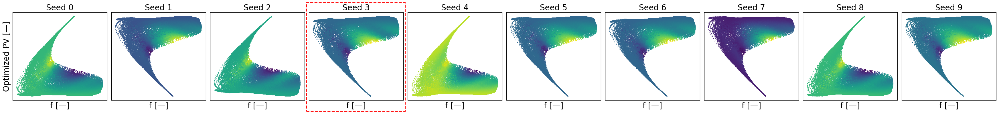

In [ ]:
path_metadata = "metadata/"
filename_species_names = "Xu-state-space-names.csv"
path_data = "data-files/"

rows, cols = 1, 10

Xu_optimized = "optimized"

save = True
pathSave = f"C:/Users/admin/Documents/Parente/Figures/2024-PV-optimization/Paper/A priori/{'Heuristic' if Xu_optimized.lower() == 'xu' else 'Optimized'}/"
name = f"f-PV manifolds - coloured by QoIs - DNS - optimized 35a - different seeds.png"

fig, axes = plt.subplots(rows, cols, figsize=(35, 4))  # Define the grid
axes = axes.flatten()
for i in range(10):
    ax = axes[i]

    filename = f"Xu-AE-opt_RMSprop-epo_100000-lr_0.025-date_28Jan2025-hour_17h43_Tr35a_s{i}"
    filename_metadata = filename + "_metadata.pkl"
    loader = loadData(filename_species_names, path_metadata, filename_metadata)
    idx_species_removed = loader.metadata["idx species removed"]
    model = loader.loadModel()
    id_model = loader.metadata["Training_id"]
    output_idx = loader.metadata["output species idx"]
    idx_species_removed = loader.metadata["idx species removed"]
    input_scaling = loader.metadata["input scaling"]
    input_species_scaling = loader.metadata["input species scaling"]
    input_species_bias = loader.metadata["input species bias"]
    range_mf  = loader.metadata["range_mf"]

    optimized_PV = model.get_PV(torch.from_numpy(np.delete(data_state_space, idx_species_removed, axis=1))).detach().numpy()
    optimized_PV_source = model.get_PV(torch.from_numpy(np.delete(data_state_space_source, idx_species_removed, axis=1))).detach().numpy()

    ax.scatter(data_mf, optimized_PV, c = optimized_PV_source, cmap = "viridis", s=1)

    ax.set_xlabel("f [\u2014]", fontsize = 20)
    ax.set_xticks([])
    if(i%cols == 0):
        ax.set_ylabel(f'Optimized PV [\u2014]', fontsize = 20)
    ax.set_yticks([])
    

    ax.set_title(f"Seed {i}", fontsize=20)

    if i == 3:
        bbox = ax.get_position()
        plt.gcf().add_artist(plt.Rectangle(
            (bbox.x0 - 0.825*bbox.width, bbox.y0 - 0.11*bbox.height),
            1.5*bbox.width,
            bbox.height + 0.23*bbox.height,
            fill=False,
            edgecolor='red',
            linestyle='--',
            linewidth=2,
            transform=plt.gcf().transFigure,
            zorder=10
        ))


plt.tight_layout()
if(save):
        plt.savefig(f"{pathSave}{name}", dpi = 300, bbox_inches="tight")
plt.show()

Without scaling layer

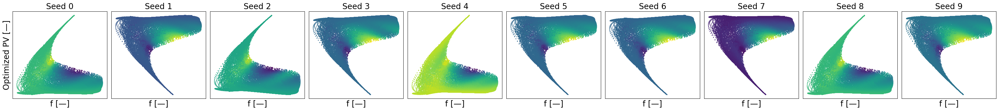

In [ ]:
path_metadata = "metadata/"
filename_species_names = "Xu-state-space-names.csv"
path_data = "data-files/"

rows, cols = 1, 10

Xu_optimized = "optimized"

save = True
pathSave = f"C:/Users/Admin/Documents/Parente/Figures/2024-PV-optimization/Paper/Results/Effect of scaling/f-PV manifold - DNS/"
name = f"f-PV manifolds - coloured by QoIs - DNS - optimized 35aW - different seeds.png"

fig, axes = plt.subplots(rows, cols, figsize=(35, 4))  # Define the grid
axes = axes.flatten()
for i in range(10):
    ax = axes[i]

    filename = f"Xu-AE-opt_RMSprop-epo_100000-lr_0.025-date_28Jan2025-hour_17h43_Tr35a_s{i}"
    filename_metadata = filename + "_metadata.pkl"
    loader = loadData(filename_species_names, path_metadata, filename_metadata)
    idx_species_removed = loader.metadata["idx species removed"]
    model = loader.loadModel()
    id_model = loader.metadata["Training_id"]
    output_idx = loader.metadata["output species idx"]
    idx_species_removed = loader.metadata["idx species removed"]
    input_scaling = loader.metadata["input scaling"]
    input_species_scaling = loader.metadata["input species scaling"]
    input_species_bias = loader.metadata["input species bias"]
    range_mf  = loader.metadata["range_mf"]

    optimized_PV = model.get_PV(torch.from_numpy(np.delete(data_state_space, idx_species_removed, axis=1))).detach().numpy()
    optimized_PV_source = model.get_PV(torch.from_numpy(np.delete(data_state_space_source, idx_species_removed, axis=1))).detach().numpy()

    ax.scatter(data_mf, optimized_PV, c = optimized_PV_source, cmap = "viridis", s=1)

    ax.set_xlabel("f [\u2014]", fontsize = 20)
    ax.set_xticks([])
    if(i%cols == 0):
        ax.set_ylabel(f'Optimized PV [\u2014]', fontsize = 20)
    ax.set_yticks([])
    ax.set_title(f"Seed {i}", fontsize=20)


plt.tight_layout()
if(save):
        plt.savefig(f"{pathSave}{name}", dpi = 300, bbox_inches="tight")
plt.show()

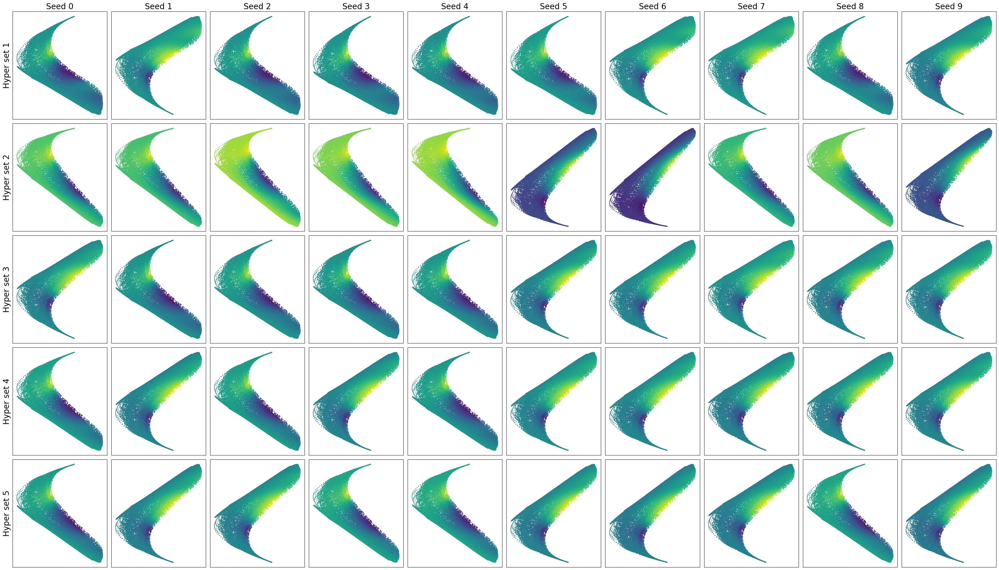

In [ ]:
path_metadata = "metadata/"
filename_species_names = "Xu-state-space-names.csv"
path_data = "data-files/"

namesWithout = ["Xu-AE-opt_RMSprop-epo_100000-lr_0.025-date_19Feb2025-hour_18h31_Tr35aW_s",
                "Xu-AE-opt_RMSprop-epo_100000-lr_0.001-date_21Nov2024-hour_15h41_Tr32k_s",
                "Xu-AE-opt_RMSprop-epo_100000-lr_0.01-date_20Feb2025-hour_19h27_Tr35abW_s",
                "Xu-AE-opt_RMSprop-epo_100000-lr_0.0075-date_21Feb2025-hour_17h37_Tr32tFullW_s",
                "Xu-AE-opt_RMSprop-epo_100000-lr_0.005-date_24Feb2025-hour_15h32_Tr35acW_s"]


namesWith = ["Xu-AE-opt_RMSprop-epo_100000-lr_0.025-date_28Jan2025-hour_17h43_Tr35a_s",
             "Xu-AE-opt_RMSprop-epo_100000-lr_0.0075-date_27Nov2024-hour_21h39_Tr32tscaleFull_s",
             "Xu-AE-opt_RMSprop-epo_100000-lr_0.001-date_16Jan2025-hour_17h33_Tr33b_s",
             "Xu-AE-opt_RMSprop-epo_100000-lr_0.01-date_20Feb2025-hour_19h30_Tr35ab_s",
             "Xu-AE-opt_RMSprop-epo_100000-lr_0.005-date_24Feb2025-hour_15h31_Tr35ac_s"
             ]

nbr_seeds = 10
rows, cols = 5, nbr_seeds

Xu_optimized = "optimized"

save = True
pathSave = f"C:/Users/Admin/Documents/Parente/Figures/2024-PV-optimization/Paper/Results/Effect of scaling/f-PV manifold - DNS/"
name = f"f-PV manifolds - coloured by QoIs - DNS - optimized - without scaling layer - different seeds.png"

fig, axes = plt.subplots(rows, cols, figsize=(35, 20))  # Define the grid
axes = axes.flatten()

idx_axis = 0

for idxName, nameModel in enumerate(namesWithout):
    for i in range(nbr_seeds):
        ax = axes[idxName*nbr_seeds + i]

        filename = f"{nameModel}{i}"
        filename_metadata = filename + "_metadata.pkl"
        loader = loadData(filename_species_names, path_metadata, filename_metadata)
        idx_species_removed = loader.metadata["idx species removed"]
        model = loader.loadModel()
        id_model = loader.metadata["Training_id"]
        output_idx = loader.metadata["output species idx"]
        idx_species_removed = loader.metadata["idx species removed"]
        input_scaling = loader.metadata["input scaling"]
        input_species_scaling = loader.metadata["input species scaling"]
        input_species_bias = loader.metadata["input species bias"]
        range_mf  = loader.metadata["range_mf"]

        optimized_PV = model.get_PV(torch.from_numpy(np.delete(data_state_space, idx_species_removed, axis=1))).detach().numpy()
        optimized_PV_source = model.get_PV(torch.from_numpy(np.delete(data_state_space_source, idx_species_removed, axis=1))).detach().numpy()

        ax.scatter(data_mf, optimized_PV, c = optimized_PV_source, cmap = "viridis", s=1)
        ax.set_xticks([])
        if(idx_axis%nbr_seeds == 0):
            ax.set_ylabel(f'Hyper set {idxName+1}', fontsize = 20)
        ax.set_yticks([])
        if(idxName == 0):
             ax.set_title(f"Seed {i}", fontsize=20)

        idx_axis += 1


plt.tight_layout()
if(save):
        plt.savefig(f"{pathSave}{name}", dpi = 300, bbox_inches="tight")
plt.show()

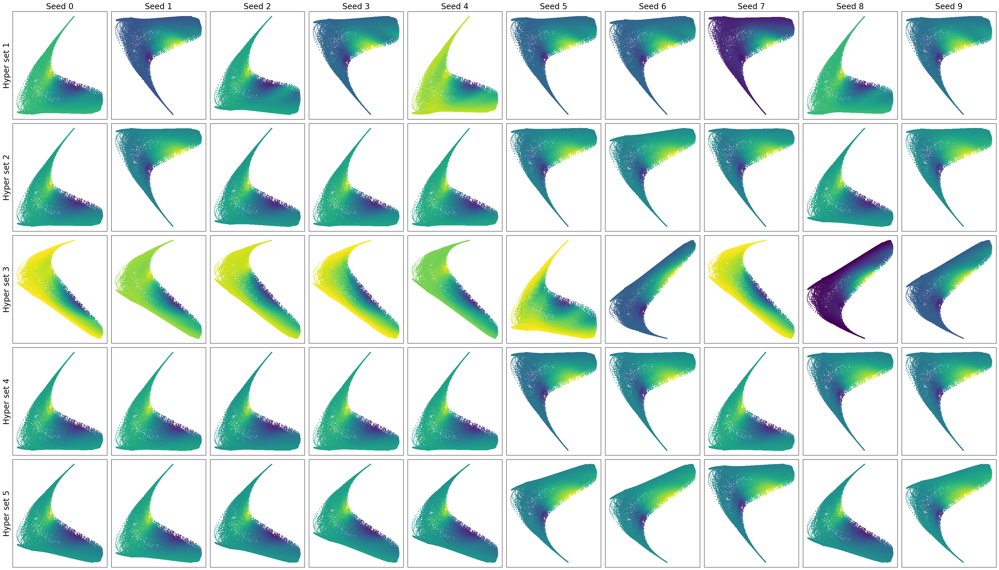

In [ ]:
path_metadata = "metadata/"
filename_species_names = "Xu-state-space-names.csv"
path_data = "data-files/"

namesWithout = ["Xu-AE-opt_RMSprop-epo_100000-lr_0.025-date_19Feb2025-hour_18h31_Tr35aW_s",
                "Xu-AE-opt_RMSprop-epo_100000-lr_0.001-date_21Nov2024-hour_15h41_Tr32k_s",
                "Xu-AE-opt_RMSprop-epo_100000-lr_0.01-date_20Feb2025-hour_19h27_Tr35abW_s",
                "Xu-AE-opt_RMSprop-epo_100000-lr_0.0075-date_21Feb2025-hour_17h37_Tr32tFullW_s",
                "Xu-AE-opt_RMSprop-epo_100000-lr_0.005-date_24Feb2025-hour_15h32_Tr35acW_s"]


namesWith = ["Xu-AE-opt_RMSprop-epo_100000-lr_0.025-date_28Jan2025-hour_17h43_Tr35a_s",
             "Xu-AE-opt_RMSprop-epo_100000-lr_0.0075-date_27Nov2024-hour_21h39_Tr32tscaleFull_s",
             "Xu-AE-opt_RMSprop-epo_100000-lr_0.001-date_16Jan2025-hour_17h33_Tr33b_s",
             "Xu-AE-opt_RMSprop-epo_100000-lr_0.01-date_20Feb2025-hour_19h30_Tr35ab_s",
             "Xu-AE-opt_RMSprop-epo_100000-lr_0.005-date_24Feb2025-hour_15h31_Tr35ac_s"
             ]

nbr_seeds = 10
rows, cols = 5, nbr_seeds

Xu_optimized = "optimized"

save = True
pathSave = f"C:/Users/Admin/Documents/Parente/Figures/2024-PV-optimization/Paper/Results/Effect of scaling/f-PV manifold - DNS/"
name = f"f-PV manifolds - coloured by QoIs - DNS - optimized - with scaling layer - different seeds.png"

fig, axes = plt.subplots(rows, cols, figsize=(35, 20))  # Define the grid
axes = axes.flatten()

idx_axis = 0

for idxName, nameModel in enumerate(namesWith):
    for i in range(nbr_seeds):
        ax = axes[idxName*nbr_seeds + i]

        filename = f"{nameModel}{i}"
        filename_metadata = filename + "_metadata.pkl"
        loader = loadData(filename_species_names, path_metadata, filename_metadata)
        idx_species_removed = loader.metadata["idx species removed"]
        model = loader.loadModel()
        id_model = loader.metadata["Training_id"]
        output_idx = loader.metadata["output species idx"]
        idx_species_removed = loader.metadata["idx species removed"]
        input_scaling = loader.metadata["input scaling"]
        input_species_scaling = loader.metadata["input species scaling"]
        input_species_bias = loader.metadata["input species bias"]
        range_mf  = loader.metadata["range_mf"]

        optimized_PV = model.get_PV(torch.from_numpy(np.delete(data_state_space, idx_species_removed, axis=1))).detach().numpy()
        optimized_PV_source = model.get_PV(torch.from_numpy(np.delete(data_state_space_source, idx_species_removed, axis=1))).detach().numpy()

        ax.scatter(data_mf, optimized_PV, c = optimized_PV_source, cmap = "viridis", s=1)
        ax.set_xticks([])
        if(idx_axis%nbr_seeds == 0):
            ax.set_ylabel(f'Hyper set {idxName+1}', fontsize = 20)
        ax.set_yticks([])
        if(idxName == 0):
             ax.set_title(f"Seed {i}", fontsize=20)

        idx_axis += 1


plt.tight_layout()
if(save):
        plt.savefig(f"{pathSave}{name}", dpi = 300, bbox_inches="tight")

***
<h2> Flamelet dataset

In [8]:
dataset = "flamelet"
input_fl, output_fl = get_dataset(path_data + f"Xu-state-space-{dataset}.csv", path_data + f"Xu-state-space_source-{dataset}.csv",
                                  path_data + f"Xu-T-{dataset}.csv", path_data + f"Xu-mf-{dataset}.csv", output_idx,
                                  idx_species_removed, input_scaling, input_species_scaling, input_species_bias, range_mf)
mf_fl, PV_fl, PV_source_fl = model.get_mf_PV_PVsource(input_fl, output_fl)

In [9]:
data_state_space_fl_df = pd.read_csv(f"{path_data}Xu-state-space-{dataset}.csv")
data_state_space_source_fl_df = pd.read_csv(f"{path_data}Xu-state-space_source-{dataset}.csv")
mf_fl_df = pd.read_csv(f"{path_data}Xu-mf-{dataset}.csv")

PV_Xu_fl = data_state_space_fl_df["H2O"] - data_state_space_fl_df["H2"] - data_state_space_fl_df["O2"]
PVsource_Xu_fl = data_state_space_source_fl_df["H2O"] - data_state_space_source_fl_df["H2"] - data_state_space_source_fl_df["O2"]

<h3> Visualize for all the QoIs

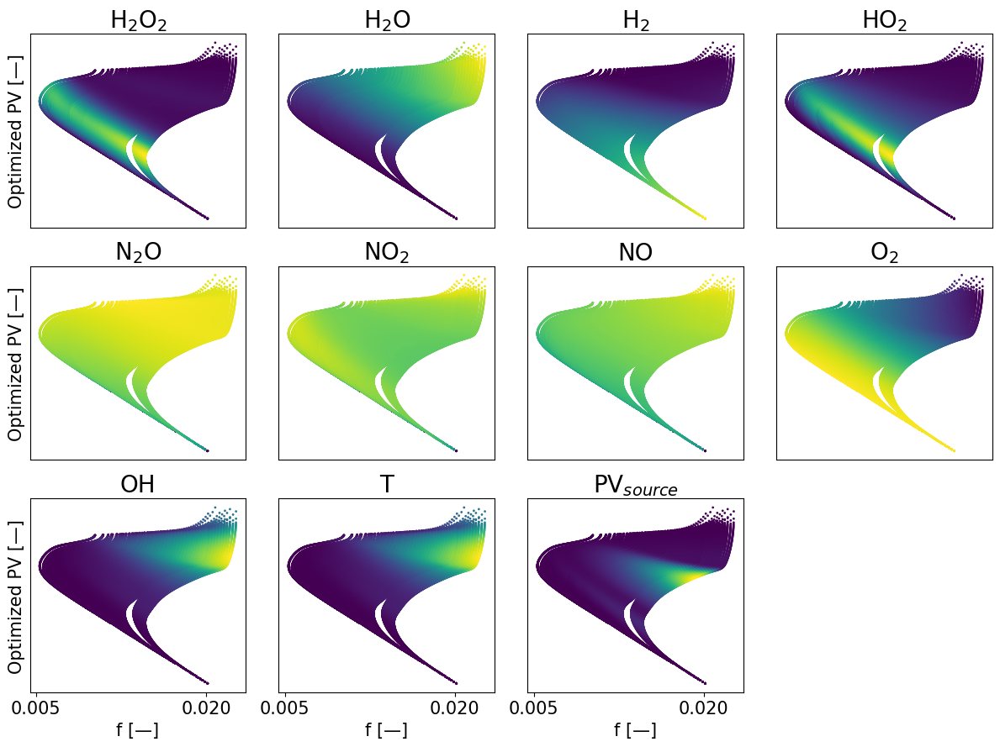

In [34]:
rows, cols = 3,4

keysSpecies = ['H2O2', 'H2O', 'H2', 'HO2', 'N2O', 'NO2', 'NO', 'O2', 'OH']
keys = ['H2O2', 'H2O', 'H2', 'HO2', 'N2O', 'NO2', 'NO', 'O2', 'OH', 'T', 'PV1']

Xu_optimized = "Optimized"

logAdd = 50

save = True
pathSave = f"C:/Users/admin/Documents/Parente/Figures/2024-PV-optimization/Paper/A priori/{'Heuristic' if Xu_optimized.lower() == 'xu' else 'Optimized'}/"
name = f"f-PV manifolds - Flamelet - coloured by QoIs - {Xu_optimized} - log(NOx + 10^{logAdd}).png"

fig, axes = plt.subplots(rows, cols, figsize=(12,9))  # Define the grid
axes = axes.flatten()
for i, key in enumerate(keys):
    ax = axes[i]

    if(Xu_optimized.lower() == "xu"):
         dataPV_fl = PV_Xu_fl
    elif(Xu_optimized.lower() == "optimized"):
         dataPV_fl = PV_fl
    else:
         raise ValueError("Variable 'Xu_optimized' has an invalid value; Choose either 'xu' or 'optimized'.")

    if(key in keysSpecies):
         dataColor = data_state_space_fl_df[key]
         if(key[0] == "N"): #For the NOx species in the log-scale
              dataColor = np.log10(data_state_space_fl_df[key] + 10**-20)
    elif(key == "T"):
         datacolor = data_T
    elif(key == "PV1"):
         if(Xu_optimized.lower() == "xu"):
            dataColor = PVsource_Xu_fl
         elif(Xu_optimized.lower() == "optimized"):
            dataColor = PV_source_fl
         

    ax.scatter(mf_fl_df, dataPV_fl, c = dataColor, cmap = "viridis", s=1)

    if(i>len(keys)-cols):
        ax.set_xticks([0.005, 0.020])
        ax.tick_params(axis="x", labelsize=15)
        ax.set_xlabel("f [\u2014]", fontsize = 15)
    else:
        ax.set_xticks([])
    if(i%cols == 0):
        ax.set_ylabel(f'{"Optimized" if Xu_optimized.lower() == "optimized" else "Heuristic"} PV [\u2014]', fontsize = 15)
    ax.set_yticks([])
    
    key = key.replace("2", "$_{2}$").replace("1", "$_{source}$")

    ax.set_title(rf"{key}", fontsize=20)


for j in range(len(keys), len(axes)): #disables axes of plots not used
    axes[j].axis("off")

handles, labels = axes[0].get_legend_handles_labels()

plt.tight_layout()
if(save):
        plt.savefig(f"{pathSave}{name}", dpi = 300, bbox_inches="tight")
plt.show()

### Visualize for different seeds

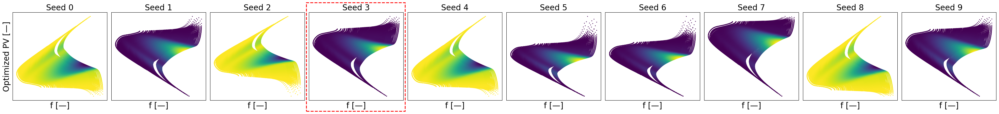

In [ ]:
path_metadata = "metadata/"
filename_species_names = "Xu-state-space-names.csv"
path_data = "data-files/"

rows, cols = 1, 10

Xu_optimized = "optimized"

save = True
pathSave = f"C:/Users/admin/Documents/Parente/Figures/2024-PV-optimization/Paper/A priori/Optimized/"
name = f"f-PV manifolds - coloured by QoIs - Flamelet - optimized 35a - different seeds.png"

fig, axes = plt.subplots(rows, cols, figsize=(35, 4))  # Define the grid
axes = axes.flatten()
for i in range(10):
    ax = axes[i]

    filename = f"Xu-AE-opt_RMSprop-epo_100000-lr_0.025-date_28Jan2025-hour_17h43_Tr35a_s{i}"
    filename_metadata = filename + "_metadata.pkl"
    loader = loadData(filename_species_names, path_metadata, filename_metadata)
    idx_species_removed = loader.metadata["idx species removed"]
    model = loader.loadModel()
    id_model = loader.metadata["Training_id"]
    output_idx = loader.metadata["output species idx"]
    idx_species_removed = loader.metadata["idx species removed"]
    input_scaling = loader.metadata["input scaling"]
    input_species_scaling = loader.metadata["input species scaling"]
    input_species_bias = loader.metadata["input species bias"]
    range_mf  = loader.metadata["range_mf"]

    dataset = "flamelet"
    input_fl, output_fl = get_dataset(path_data + f"Xu-state-space-{dataset}.csv", path_data + f"Xu-state-space_source-{dataset}.csv",
                                    path_data + f"Xu-T-{dataset}.csv", path_data + f"Xu-mf-{dataset}.csv", output_idx,
                                    idx_species_removed, input_scaling, input_species_scaling, input_species_bias, range_mf)
    mf_fl, PV_fl, PV_source_fl = model.get_mf_PV_PVsource(input_fl, output_fl)

    ax.scatter(mf_fl, PV_fl, c = PV_source_fl, cmap = "viridis", s=1)

    ax.set_xlabel("f [\u2014]", fontsize = 20)
    ax.set_xticks([])
    if(i%cols == 0):
        ax.set_ylabel(f'Optimized PV [\u2014]', fontsize = 20)
    ax.set_yticks([])
    

    ax.set_title(f"Seed {i}", fontsize=20)

    if i == 3:
        bbox = ax.get_position()
        plt.gcf().add_artist(plt.Rectangle(
            (bbox.x0 - 0.825*bbox.width, bbox.y0 - 0.11*bbox.height),
            1.5*bbox.width,
            bbox.height + 0.23*bbox.height,
            fill=False,
            edgecolor='red',
            linestyle='--',
            linewidth=2,
            transform=plt.gcf().transFigure,
            zorder=10
        ))


plt.tight_layout()
if(save):
        plt.savefig(f"{pathSave}{name}", dpi = 300, bbox_inches="tight")
plt.show()

***
## Visualize the weights: Heuristic vs Optimized

## All f-PV manifolds and weight definitions together

In [15]:
filename_autoignition = "isochoric-adiabatic-closed-HR-H2-air-lin_Z_0.015_0.035_100-T0_900-"
path_data_autoignition = "data-files/autoignition/"
path_data = "data-files/"

#create all the datasets
mixture_fractions_train_0D = np.loadtxt(f"{path_data_autoignition}{filename_autoignition}mixture-fraction.csv") #1 x nbr_timesteps
mixture_fractions_test = np.loadtxt(f"{path_data_autoignition}{filename_autoignition}mixture-fractions-test-trajectories.csv") #1 x nbr_test_trajectories
state_space_names = np.genfromtxt(f"{path_data_autoignition}{filename_autoignition}state-space-names.csv", delimiter=",", dtype=str)
state_space_train_0D = pd.read_csv(f"{path_data_autoignition}{filename_autoignition}state-space.csv", names = state_space_names)
state_space_source_train_0D = pd.read_csv(f"{path_data_autoignition}{filename_autoignition}state-space-sources.csv", names = state_space_names)
time_train = np.loadtxt(f"{path_data_autoignition}{filename_autoignition}time.csv") #1 x nbr_timesteps

In [ ]:
filename_model = "Xu-AE-opt_adam-epo_100000-lr_0.025-date_14Mar2025-hour_14h23_Tr0D-2q_s0"

filename_metadata = filename_model + "_metadata.pkl"
path_metadata = "metadata/"
filename_species_names = "Xu-state-space-names.csv"
path_data = "data-files/"

loader = loadData(filename_species_names, path_metadata, filename_metadata)
idx_species_removed = loader.metadata["list idx species removed source"] if loader.metadata["dataset_type"]=="autoignition_augm" else loader.metadata["idx species removed"]
id_model = loader.metadata["Training_id"]
model_0D = loader.loadModel()

weight_inversion = True
if(weight_inversion):
    with torch.no_grad():  # Ensures we do not track gradients for this operation
        model_0D.encoder_species.weight.mul_(-1)

state_space_names_DNS = np.genfromtxt(f"{path_data}Xu-state-space-names.csv", delimiter=",", dtype=str)

#create a np array in the format for the DNS dataset/optimized PV
state_space_train_DNS = state_space_train_0D[state_space_names_DNS].to_numpy()
state_space_source_train_DNS = state_space_source_train_0D[state_space_names_DNS].to_numpy()
print(state_space_source_train_DNS.shape)

PV_optimized_train_0D = model_0D.get_PV(torch.from_numpy(np.delete(state_space_train_DNS, idx_species_removed, axis=1))).detach().numpy()
PV_optimized_source_train_0D = model_0D.get_PV(torch.from_numpy(np.delete(state_space_source_train_DNS, idx_species_removed, axis=1))).detach().numpy()

(241519, 21)


In [17]:
PV_Xu_train_0D = state_space_train_0D["H2O"] - state_space_train_0D["H2"] - state_space_train_0D["O2"]
PV_Xu_train_0D = PV_Xu_train_0D.to_numpy().reshape(-1,1)

PV_Xu_train_source_0D = state_space_source_train_0D["H2O"] - state_space_source_train_0D["H2"] - state_space_source_train_0D["O2"]
PV_Xu_train_source_0D = PV_Xu_train_source_0D.to_numpy().reshape(-1,1)

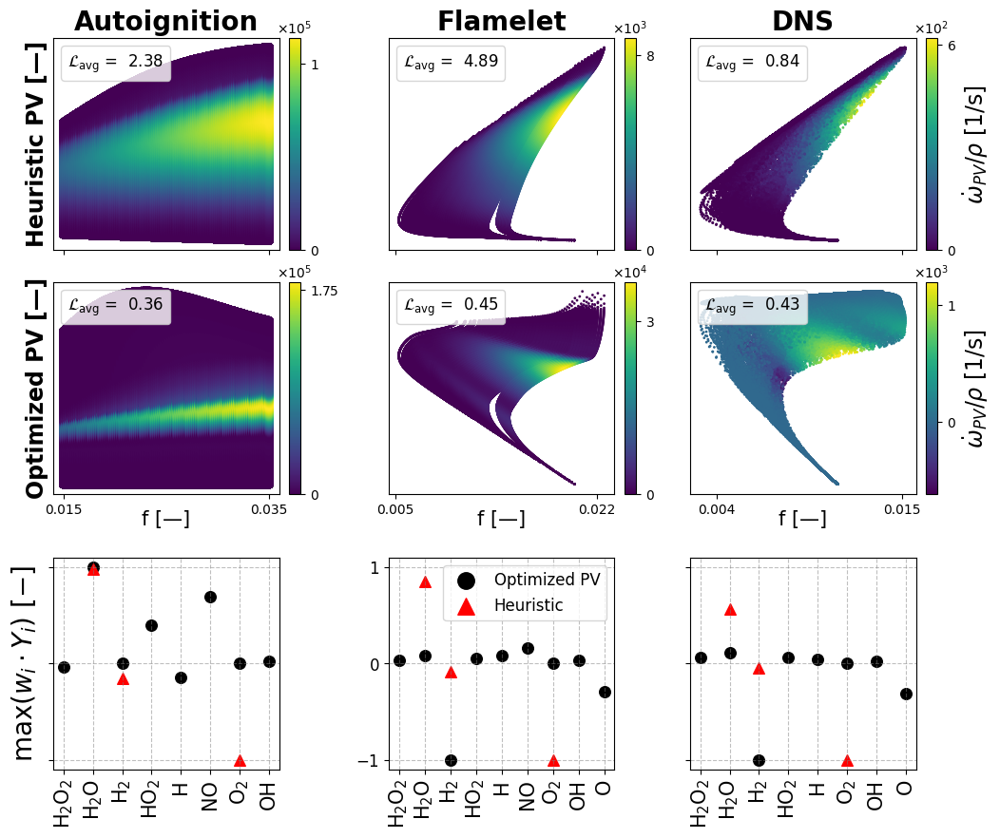

In [ ]:
save = True
pathSave = "C:/Users/admin/Documents/Parente/Figures/2024-PV-optimization/Paper/Results/Comparison Xu vs optimized/f-PV manifolds/"
name = f"Comparison manifolds and weights - DNS - Flamelet - 0D - mirrored.png"

fig = plt.figure(figsize=(12, 10))
gs = gridspec.GridSpec(4, 8, width_ratios=[1, 0.05, 0.3, 1, 0.05, 0.15, 1, 0.05], wspace=0.1, height_ratios=[1, 1, 0.001, 1])

def compute_avg(costs):
    n = len(costs)
    sum = np.sum(costs**2)
    return 1/n*np.sqrt(sum)

list_costs = ["costs_Xu-bw_-6_2_100-p_4-ver_sh_1-dataset_low", "costs_Tr35a_s3-bw_-6_2_100-p_4-ver_sh_1-dataset_low", "costs_Xu-bw_-6_2_100-p_4-ver_sh_1-dataset_flamelet", "costs_Tr35a_s3-bw_-6_2_100-p_4-ver_sh_1-dataset_flamelet", "costs_Xu-bw_-6_2_100-p_4-ver_sh_1-dataset_autoignition","costs_Tr0D-2q_s0-bw_-6_2_100-p_4-ver_sh_1-dataset_autoignition"]
avg_costs = [compute_avg(np.load(f"data-files/costs/{cost_name}.npy")) for cost_name in list_costs]
avg_costs[4] = 2.38 #file has been rewritten with wrong values (log(PVsource))

# --- DNS ---
ax_dns_heur = fig.add_subplot(gs[0, 6])
sc1 = ax_dns_heur.scatter(data_mf, PV_Xu, c=PV_source_Xu, s=1, cmap='viridis')
ax_dns_heur.set_title('DNS', fontsize=20, fontweight='bold')
ax_dns_heur.set_yticks([])
ax_dns_heur.set_xticklabels([])
formatter1 = ScalarFormatter(useMathText=True)
formatter1.set_powerlimits((0, 0))
cbar1 = fig.colorbar(sc1, cax=fig.add_subplot(gs[0, 7]))
cbar1.set_ticks([0, 600]) #[0, 300, 600]
cbar1.ax.yaxis.set_major_formatter(formatter1)
cbar1.set_label(r'$\dot{\omega}_{PV} / \rho$ [1/s]', fontsize = 17)
offset_text = cbar1.ax.yaxis.get_offset_text()
offset_text.set_x(offset_text.get_position()[0] + 1)
cbar1.ax.tick_params(labelsize=10)
dummy = Line2D([], [], color='none', label=f"$\mathcal{{L}}_{{\mathrm{{avg}}}}$ =  {np.round(avg_costs[0], 2)}")
ax_dns_heur.legend(handles=[dummy], loc='upper left', fontsize = 12,
                   handlelength=0, handletextpad=0)

ax_dns_opt = fig.add_subplot(gs[1, 6])
sc2 = ax_dns_opt.scatter(data_mf, optimized_PV, c=optimized_PV_source, s=1, cmap='viridis')
ax_dns_opt.set_xlabel('f [—]', fontsize=15, labelpad=-5)
ax_dns_opt.set_yticks([])
cbar2 = fig.colorbar(sc2, cax=fig.add_subplot(gs[1, 7]))
cbar2.set_ticks([0, 1000]) #[-500, 0, 1000]
cbar2.ax.yaxis.set_major_formatter(formatter1)
cbar2.set_label(r'$\dot{\omega}_{PV} / \rho$ [1/s]', fontsize = 17)
offset_text = cbar2.ax.yaxis.get_offset_text()
offset_text.set_x(offset_text.get_position()[0] + 1)
cbar2.ax.tick_params(labelsize=10)
dummy = Line2D([], [], color='none', label=f"$\mathcal{{L}}_{{\mathrm{{avg}}}}$ =  {np.round(avg_costs[1], 2)}")
ax_dns_opt.legend(handles=[dummy], loc='upper left', fontsize = 12,
                   handlelength=0, handletextpad=0)

# --- Flamelet ---
ax_fl_heur = fig.add_subplot(gs[0, 3])
sc3 = ax_fl_heur.scatter(mf_fl_df, PV_Xu_fl, c=PVsource_Xu_fl, s=1, cmap='viridis')
ax_fl_heur.set_title('Flamelet', fontsize=20, fontweight='bold')
ax_fl_heur.set_yticks([])
ax_fl_heur.set_xticklabels([])
cbar3 = fig.colorbar(sc3, cax=fig.add_subplot(gs[0, 4]))
cbar3.set_ticks([0, 8000]) #[0, 4000, 8000]
cbar3.ax.tick_params(labelsize=10)
cbar3.ax.yaxis.set_major_formatter(formatter1)
offset_text = cbar3.ax.yaxis.get_offset_text()
offset_text.set_x(offset_text.get_position()[0] + 1)
dummy = Line2D([], [], color='none', label=f"$\mathcal{{L}}_{{\mathrm{{avg}}}}$ =  {np.round(avg_costs[2], 2)}")
ax_fl_heur.legend(handles=[dummy], loc='upper left', fontsize = 12,
                   handlelength=0, handletextpad=0)

ax_fl_opt = fig.add_subplot(gs[1, 3])
sc4 = ax_fl_opt.scatter(mf_fl_df, PV_fl, c=PV_source_fl, s=1, cmap='viridis')
ax_fl_opt.set_xlabel('f [—]', fontsize=15, labelpad=-5)
ax_fl_opt.set_yticks([])
cbar4 = fig.colorbar(sc4, cax=fig.add_subplot(gs[1, 4]))
cbar4.set_ticks([0, 30000]) #[0, 10000, 20000, 30000]
cbar4.ax.tick_params(labelsize=10)
cbar4.ax.yaxis.set_major_formatter(formatter1)
offset_text = cbar4.ax.yaxis.get_offset_text()
offset_text.set_x(offset_text.get_position()[0] + 1)
dummy = Line2D([], [], color='none', label=f"$\mathcal{{L}}_{{\mathrm{{avg}}}}$ =  {np.round(avg_costs[3], 2)}")
ax_fl_opt.legend(handles=[dummy], loc='upper left', fontsize = 12,
                   handlelength=0, handletextpad=0)

# --- Autoignition ---
ax_ai_heur = fig.add_subplot(gs[0, 0])
sc5 = ax_ai_heur.scatter(mixture_fractions_train_0D, PV_Xu_train_0D, c=PV_Xu_train_source_0D, cmap='viridis')
ax_ai_heur.set_title('Autoignition', fontsize=20, fontweight='bold')
ax_ai_heur.set_yticks([])
ax_ai_heur.set_xticklabels([])
ax_ai_heur.set_ylabel('Heuristic PV [—]', fontweight='bold', fontsize=17)
cbar5 = fig.colorbar(sc5, cax=fig.add_subplot(gs[0, 1]))
cbar5.set_ticks([0, 100000])
cbar5.ax.tick_params(labelsize=10)
cbar5.ax.yaxis.set_major_formatter(formatter1)
offset_text = cbar5.ax.yaxis.get_offset_text()
offset_text.set_x(offset_text.get_position()[0] + 1)
dummy = Line2D([], [], color='none', label=f"$\mathcal{{L}}_{{\mathrm{{avg}}}}$ =  {np.round(avg_costs[4], 2)}")
ax_ai_heur.legend(handles=[dummy], loc='upper left', fontsize = 12,
                   handlelength=0, handletextpad=0)

class CustomScalarFormatter(ScalarFormatter):
    def __init__(self, useOffset=True, useMathText=False):
        super().__init__(useOffset=useOffset, useMathText=useMathText)

    def __call__(self, x, pos=None):
        # If the value is zero, format it as "0" instead of "0.00"
        if x == 0:
            return "0"
        else:
            return super().__call__(x, pos)

ax_ai_opt = fig.add_subplot(gs[1, 0])
sc6 = ax_ai_opt.scatter(mixture_fractions_train_0D, PV_optimized_train_0D, c=PV_optimized_source_train_0D, cmap='viridis')
ax_ai_opt.set_xlabel('f [—]', fontsize=15, labelpad=-5)
ax_ai_opt.set_yticks([])
ax_ai_opt.set_ylabel('Optimized PV [—]', fontweight='bold', fontsize=17)
cbar6 = fig.colorbar(sc6, cax=fig.add_subplot(gs[1, 1]))
cbar6.set_ticks([0, 175000])
formatter2 = CustomScalarFormatter(useMathText=True)
formatter2.set_powerlimits((0, 0))
cbar6.ax.yaxis.set_major_formatter(formatter2)
offset_text = cbar6.ax.yaxis.get_offset_text()
offset_text.set_x(offset_text.get_position()[0] + 1)
dummy = Line2D([], [], color='none', label=f"$\mathcal{{L}}_{{\mathrm{{avg}}}}$ =  {np.round(avg_costs[5], 2)}")
ax_ai_opt.legend(handles=[dummy], loc='upper left', fontsize = 12,
                   handlelength=0, handletextpad=0)

cbar6.ax.tick_params(labelsize=10)


# Shared xticks and formatting
ax_dns_opt.set_xticks([0.004, 0.015]) #[0.004, 0.009, 0.014]
ax_fl_opt.set_xticks([0.005, 0.022]) #[0.005, 0.01, 0.015, 0.02]
ax_ai_opt.set_xticks([0.015, 0.035])
ax_dns_heur.set_xticks([0.004, 0.015])
ax_fl_heur.set_xticks([0.005, 0.022])
ax_ai_heur.set_xticks([0.015, 0.035])

for ax in [ax_dns_heur, ax_dns_opt, ax_fl_heur, ax_fl_opt, ax_ai_heur, ax_ai_opt]:
    ax.tick_params(axis='x', labelsize=10)
    ax.grid(False)


#############################
# Weights

dataset = "low"
abs = False

path_state = path_data + f"Xu-state-space-{dataset}.csv"

#get index spcies removed
my_species_Xu = Species(path_data)

list_species_Xu = my_species_Xu.get_list_species()
for index in sorted(idx_species_removed, reverse=True): #same species to remove
    list_species_Xu.pop(index)

final_weights_Xu = np.zeros(19)
final_weights_Xu[list_species_Xu.index("H2O")] = 1
final_weights_Xu[list_species_Xu.index("H2")] = -1
final_weights_Xu[list_species_Xu.index("O2")] = -1

#get mass fractions of species
state_space_Xu = read_csv(path_state, header = None)
state_space_Xu = state_space_Xu.drop(state_space_Xu.columns[idx_species_removed], axis=1)
state_space_matrix_Xu = state_space_Xu.to_numpy()

wi_Yi_Xu = state_space_matrix_Xu*np.abs(final_weights_Xu) #|w_i|*Y_i
if(abs):
    max_wi_Yi_Xu = np.max(wi_Yi_Xu, axis = 0) #take max of every species
else:
    max_wi_Yi_Xu = np.sign(final_weights_Xu)*np.max(wi_Yi_Xu, axis = 0) #take max of every species

final_weights = model.get_total_encoder_weights(npy = True)[0]

#get index spcies removed
my_species = Species(path_data)

list_species = my_species.get_list_species()
for index in sorted(idx_species_removed, reverse=True):
    list_species.pop(index)

#get mass fractions of species
state_space = read_csv(path_state, header = None)
state_space = state_space.drop(state_space.columns[idx_species_removed], axis=1)
state_space_matrix = state_space.to_numpy()

wi_Yi = state_space_matrix*np.abs(final_weights) #|w_i|*Y_i
if(abs):
    max_wi_Yi = np.max(wi_Yi, axis = 0) #take max of every species
else:
    max_wi_Yi = np.sign(final_weights)*np.max(wi_Yi, axis = 0) #take max of every species

max_wi_Yi_scaled_Xu_DNS = max_wi_Yi_Xu/np.max(np.abs(max_wi_Yi_Xu))
max_wi_Yi_scaled_DNS = max_wi_Yi/np.max(np.abs(max_wi_Yi))


###########################
# FLAMELET
#########################
dataset = "flamelet"
abs = False

path_state = path_data + f"Xu-state-space-{dataset}.csv"

#get index spcies removed
my_species_Xu = Species(path_data)

list_species_Xu = my_species_Xu.get_list_species()
for index in sorted(idx_species_removed, reverse=True): #same species to remove
    list_species_Xu.pop(index)

final_weights_Xu = np.zeros(19)
final_weights_Xu[list_species_Xu.index("H2O")] = 1
final_weights_Xu[list_species_Xu.index("H2")] = -1
final_weights_Xu[list_species_Xu.index("O2")] = -1

#get mass fractions of species
state_space_Xu = read_csv(path_state, header = "infer")
state_space_Xu = state_space_Xu.drop(state_space_Xu.columns[idx_species_removed], axis=1)
state_space_matrix_Xu = state_space_Xu.to_numpy()

wi_Yi_Xu = state_space_matrix_Xu*np.abs(final_weights_Xu) #|w_i|*Y_i
if(abs):
    max_wi_Yi_Xu = np.max(wi_Yi_Xu, axis = 0) #take max of every species
else:
    max_wi_Yi_Xu = np.sign(final_weights_Xu)*np.max(wi_Yi_Xu, axis = 0) #take max of every species

final_weights = model.get_total_encoder_weights(npy = True)[0]

#get index spcies removed
my_species = Species(path_data)

list_species = my_species.get_list_species()
for index in sorted(idx_species_removed, reverse=True):
    list_species.pop(index)

#get mass fractions of species
state_space = read_csv(path_state, header = "infer")
state_space = state_space.drop(state_space.columns[idx_species_removed], axis=1)
state_space_matrix = state_space.to_numpy()

wi_Yi = state_space_matrix*np.abs(final_weights) #|w_i|*Y_i
if(abs):
    max_wi_Yi = np.max(wi_Yi, axis = 0) #take max of every species
else:
    max_wi_Yi = np.sign(final_weights)*np.max(wi_Yi, axis = 0) #take max of every species

max_wi_Yi_scaled_Xu_fl = max_wi_Yi_Xu/np.max(np.abs(max_wi_Yi_Xu))
max_wi_Yi_scaled_fl = max_wi_Yi/np.max(np.abs(max_wi_Yi))


##############
# AUTOIGNITION
##############

dataset = "autoignition"
invertWeights = True
abs = False

path_state = path_data + f"Xu-state-space-{dataset}.csv"

#get index spcies removed
my_species_Xu = Species(path_data)

list_species_Xu = my_species_Xu.get_list_species()
for index in sorted(idx_species_removed, reverse=True): #same species to remove
    list_species_Xu.pop(index)

final_weights_Xu = np.zeros(19)
final_weights_Xu[list_species_Xu.index("H2O")] = 1
final_weights_Xu[list_species_Xu.index("H2")] = -1
final_weights_Xu[list_species_Xu.index("O2")] = -1

#get mass fractions of species
state_space_Xu = read_csv(path_state)
state_space_Xu = state_space_Xu.drop(state_space_Xu.columns[idx_species_removed], axis=1)
state_space_matrix_Xu = state_space_Xu.to_numpy()

wi_Yi_Xu = state_space_matrix_Xu*np.abs(final_weights_Xu) #|w_i|*Y_i
if(abs):
    max_wi_Yi_Xu = np.max(wi_Yi_Xu, axis = 0) #take max of every species
else:
    max_wi_Yi_Xu = np.sign(final_weights_Xu)*np.max(wi_Yi_Xu, axis = 0) #take max of every species


filename_model_0D = "Xu-AE-opt_adam-epo_100000-lr_0.025-date_14Mar2025-hour_14h23_Tr0D-2q_s0"
filename_metadata_0D = filename_model_0D + "_metadata.pkl"

loader_0D = loadData(filename_species_names, path_metadata, filename_metadata_0D)
id_model_0D = loader_0D.metadata["Training_id"]
model_0D = loader_0D.loadModel()

final_weights = model_0D.get_total_encoder_weights(npy = True)[0]

#get index spcies removed
my_species = Species(path_data)

list_species = my_species.get_list_species()
for index in sorted(idx_species_removed, reverse=True):
    list_species.pop(index)

#get mass fractions of species
state_space = read_csv(path_state)
state_space = state_space.drop(state_space.columns[idx_species_removed], axis=1)
state_space_matrix = state_space.to_numpy()

wi_Yi = state_space_matrix*np.abs(final_weights) #|w_i|*Y_i
if(abs):
    max_wi_Yi = np.max(wi_Yi, axis = 0) #take max of every species
else:
    max_wi_Yi = np.sign(final_weights)*np.max(wi_Yi, axis = 0) #take max of every species

max_wi_Yi_scaled_Xu_0D = max_wi_Yi_Xu/np.max(np.abs(max_wi_Yi_Xu))
max_wi_Yi_scaled_0D = max_wi_Yi/np.max(np.abs(max_wi_Yi))

if(invertWeights):
    max_wi_Yi_scaled_0D = -max_wi_Yi_scaled_0D

#############################################

# Weight plots

#################
#DNS

latex_species_list = [s.replace('2', r'$_2$') for s in list_species]
latex_species_list = [s.replace('3', r'$_3$') for s in latex_species_list]

valid_indices_DNS = [i for i in range(len(max_wi_Yi_scaled_DNS)) if np.abs(max_wi_Yi_scaled_DNS[i]) > 0.01 or np.abs(max_wi_Yi_scaled_Xu_DNS[i]) > 0.01]

# Filter data
filtered_max_wi_Yi_scaled_DNS = max_wi_Yi_scaled_DNS[valid_indices_DNS]
filtered_max_wi_Yi_scaled_Xu_DNS = max_wi_Yi_scaled_Xu_DNS[valid_indices_DNS]
filtered_species_list_DNS = [latex_species_list[i] for i in valid_indices_DNS]

non_zero_mask_filtered_DNS = filtered_max_wi_Yi_scaled_Xu_DNS != 0

ax_w_DNS = fig.add_subplot(gs[3, 6])
ax_w_DNS.scatter(np.arange(len(filtered_max_wi_Yi_scaled_DNS)), filtered_max_wi_Yi_scaled_DNS, label="Optimized PV", color="k", s=70)
ax_w_DNS.scatter(np.arange(len(filtered_max_wi_Yi_scaled_Xu_DNS))[non_zero_mask_filtered_DNS], filtered_max_wi_Yi_scaled_Xu_DNS[non_zero_mask_filtered_DNS], color="r", label="Heuristic PV", marker="^", s=70)

ax_w_DNS.set_xticks(np.arange(len(filtered_species_list_DNS)))
ax_w_DNS.set_xticklabels(filtered_species_list_DNS, rotation=90)
ax_w_DNS.tick_params(axis='x', labelsize=15)
ax_w_DNS.set_ylim([-1.1, 1.1])
ax_w_DNS.set_yticks([-1, 0, 1])
ax_w_DNS.set_yticklabels([])
ax_w_DNS.grid(True, linestyle='--', color='gray', alpha=0.5)

##########
# FLAMELET

valid_indices_fl = [i for i in range(len(max_wi_Yi_scaled_fl)) if np.abs(max_wi_Yi_scaled_fl[i]) > 0.01 or np.abs(max_wi_Yi_scaled_Xu_fl[i]) > 0.01]

# Filter data
filtered_max_wi_Yi_scaled_fl = max_wi_Yi_scaled_fl[valid_indices_fl]
filtered_max_wi_Yi_scaled_Xu_fl = max_wi_Yi_scaled_Xu_fl[valid_indices_fl]
filtered_species_list_fl = [latex_species_list[i] for i in valid_indices_fl]

non_zero_mask_filtered_fl = filtered_max_wi_Yi_scaled_Xu_fl != 0

ax_w_fl = fig.add_subplot(gs[3, 3])
ax_w_fl.scatter(np.arange(len(filtered_max_wi_Yi_scaled_fl)), filtered_max_wi_Yi_scaled_fl, label="Optimized PV", color="k", s=70)
ax_w_fl.scatter(np.arange(len(filtered_max_wi_Yi_scaled_Xu_fl))[non_zero_mask_filtered_fl], filtered_max_wi_Yi_scaled_Xu_fl[non_zero_mask_filtered_fl], color="r", label="Heuristic", marker="^", s=70)
ax_w_fl.set_ylim([-1.1, 1.1])
ax_w_fl.set_xticks(np.arange(len(filtered_species_list_fl)))
ax_w_fl.set_xticklabels(filtered_species_list_fl, rotation=90)
ax_w_fl.tick_params(axis='x', labelsize=15)
ax_w_fl.tick_params(axis='y', labelsize=12)
ax_w_fl.grid(True, linestyle='--', color='gray', alpha=0.5)
ax_w_fl.legend(fontsize=12, loc='upper right', ncol=1, scatterpoints=1, markerscale=1.5)
ax_w_fl.set_yticks([-1, 0, 1])


###############
# Autoignition


valid_indices_0D = [i for i in range(len(max_wi_Yi_scaled_0D)) if np.abs(max_wi_Yi_scaled_0D[i]) > 0.01 or np.abs(max_wi_Yi_scaled_Xu_0D[i]) > 0.01]

# Filter data
filtered_max_wi_Yi_scaled_0D = max_wi_Yi_scaled_0D[valid_indices_0D]
filtered_max_wi_Yi_scaled_Xu_0D = max_wi_Yi_scaled_Xu_0D[valid_indices_0D]
filtered_species_list_0D = [latex_species_list[i] for i in valid_indices_0D]

non_zero_mask_filtered_0D = filtered_max_wi_Yi_scaled_Xu_0D != 0

ax_w_0D = fig.add_subplot(gs[3, 0])
ax_w_0D.scatter(np.arange(len(filtered_max_wi_Yi_scaled_0D)), filtered_max_wi_Yi_scaled_0D, label="Optimized PV", color="k", s=70)
ax_w_0D.scatter(np.arange(len(filtered_max_wi_Yi_scaled_Xu_0D))[non_zero_mask_filtered_0D], filtered_max_wi_Yi_scaled_Xu_0D[non_zero_mask_filtered_0D], color="r", label="Heuristic", marker="^", s=70)
ax_w_0D.set_ylim([-1.1, 1.1])
ax_w_0D.set_xticks(np.arange(len(filtered_species_list_0D)))
ax_w_0D.set_xticklabels(filtered_species_list_0D, rotation=90)
ax_w_0D.set_yticks([-1, 0, 1])
ax_w_0D.set_yticklabels([])
if abs:
    ax_w_0D.set_ylabel(r"max($|w_i| \cdot Y_i$) [$-$]", fontsize=20)
else:
    ax_w_0D.set_ylabel(r"max($w_i \cdot Y_i$) [$-$]", fontsize=20)
ax_w_0D.tick_params(axis='x', labelsize=15)
ax_w_0D.grid(True, linestyle='--', color='gray', alpha=0.5)


if save:
    plt.savefig(f"{pathSave}{name}", dpi = 1000, bbox_inches = "tight")

plt.show()